# Homework 6

# Задача №1 - Выделить береговую линию

Теперь приступим к задаче сегментации на картинках. Реализуйте программу, которая определить береговую линию, то есть разделит изображение на 2 класса: берег и вода. Разметка лежит в папке ships/ground_truth

Примеры изображений:
<table><tr>
    <td> <img src="ships/img/0d5b831d8.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="ships/ground_truth/0d5b831d8.png" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

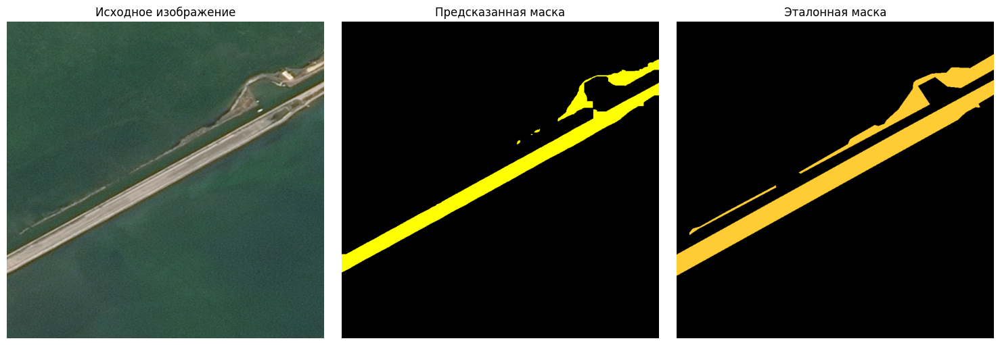

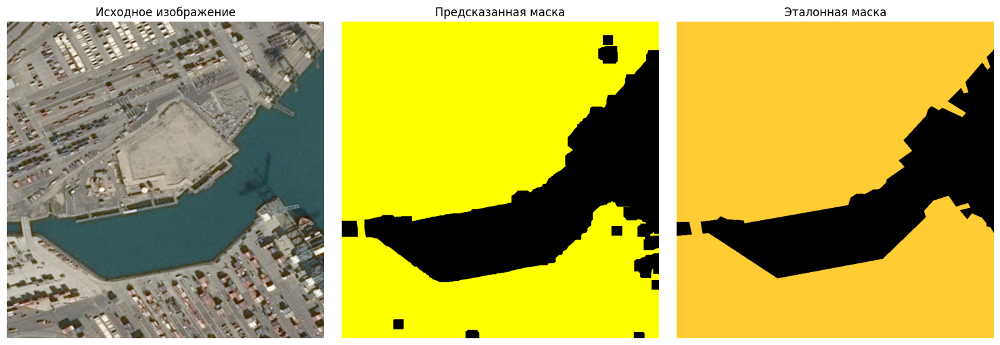

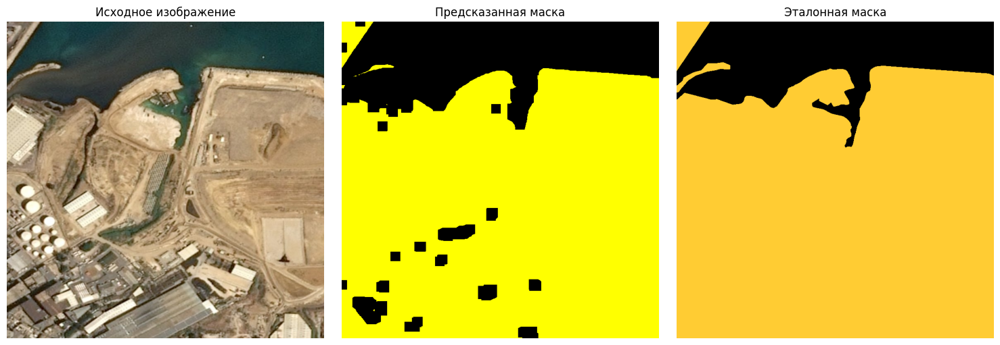

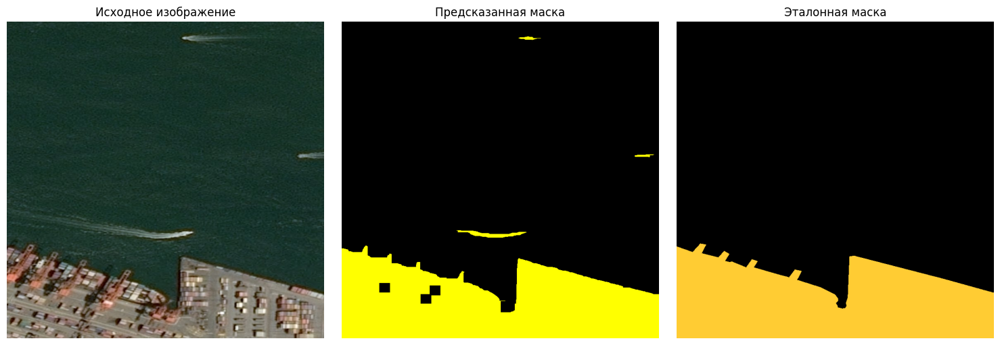

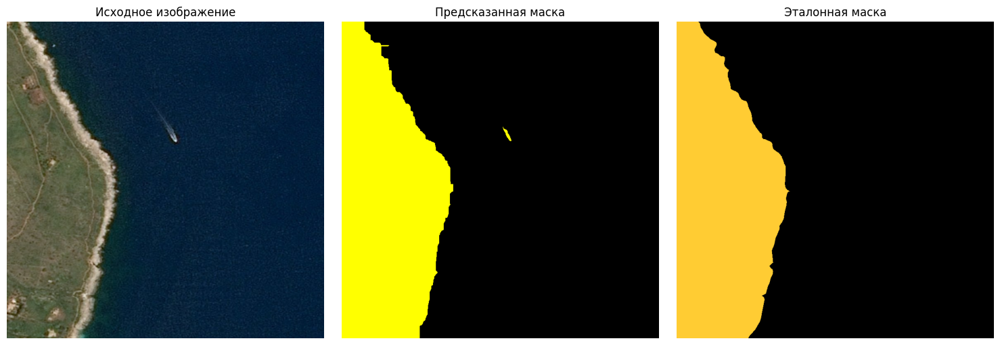

...

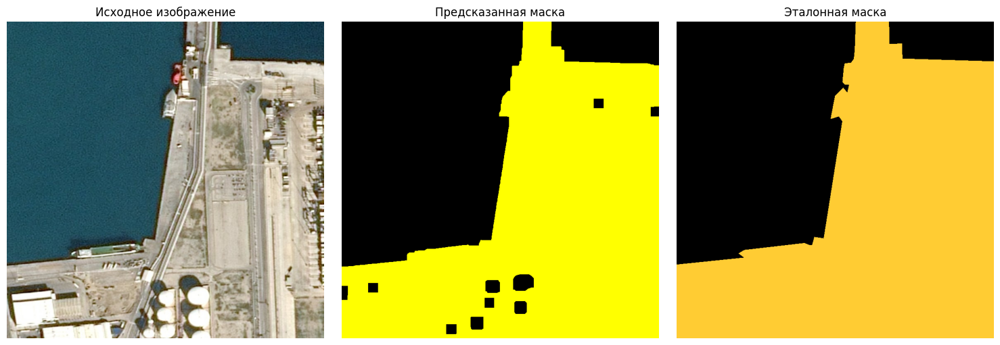

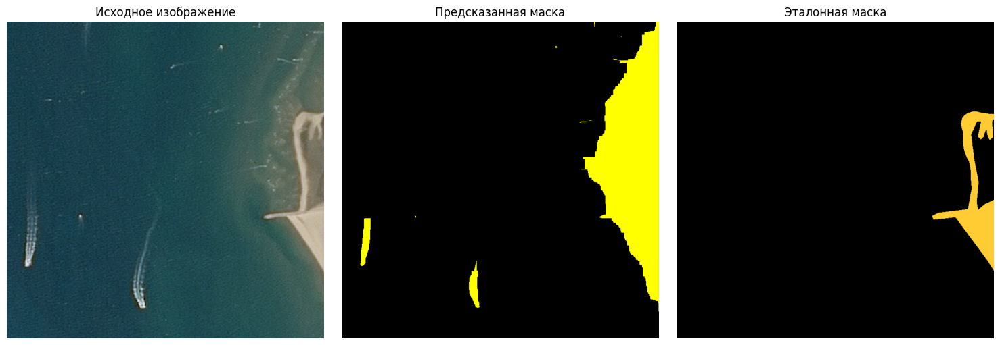

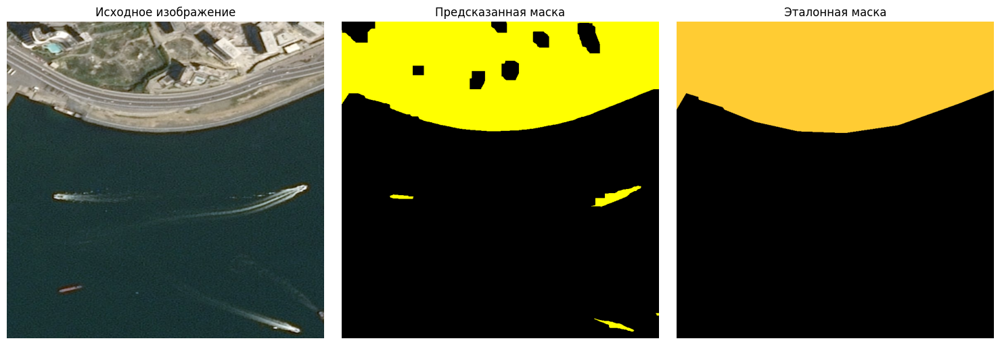

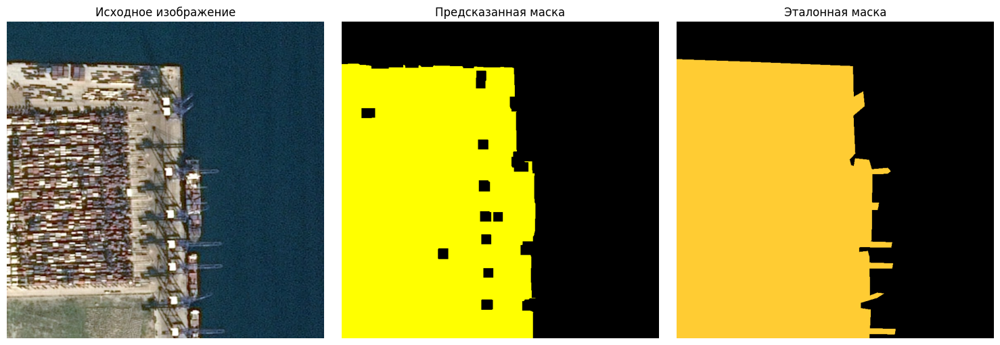

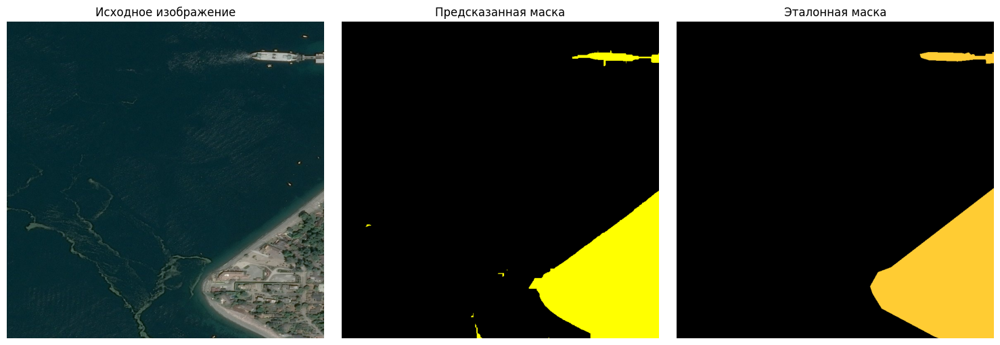

In [15]:
import cv2
import numpy as np

import matplotlib.pyplot as plt
import os

ships_path = 'ships/img'
truth_path = "ships/ground_truth"
for file_name in os.listdir(ships_path):
    file_path = os.path.join(ships_path, file_name)
    
    image = cv2.imread(file_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray_img, (7, 7), 0)
    # mask = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    _, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    kernel = np.ones((19, 19), np.uint8)
    opening = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)

    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.dilate(opening, kernel, iterations=1)

    

    mask_colored = np.zeros_like(image)
    mask_colored[mask == 255] = (0, 0, 0)
    mask_colored[mask == 0] = (0, 255, 255)

    truth_file = os.path.join(truth_path, os.path.splitext(file_name)[0] + ".png")
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(image_rgb)
    axes[0].set_title("Исходное изображение")
    axes[0].axis("off")

    axes[1].imshow(cv2.cvtColor(mask_colored, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Предсказанная маска")
    axes[1].axis("off")

    truth_mask_rgb = None
    if os.path.exists(truth_file):
        truth_mask_rgb = cv2.imread(truth_file)
        truth_mask_rgb = cv2.cvtColor(truth_mask_rgb, cv2.COLOR_BGR2RGB)
    if truth_mask_rgb is not None:
        axes[2].imshow(truth_mask_rgb)
    else:
        axes[2].text(0.5, 0.5, "Ground truth отсутствует", ha="center", va="center")
    axes[2].set_title("Эталонная маска")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Задача №2 - Отделить три класса (треугольник, круг, квадрат) друг от друга

Реализуйте программу, которая делит изображение на три класса : треугольник, круг, квадрат. Сложность состоит в том, что сегментацию нужно выполнить и на зашумленных данных. Все картинки лежат в папке figures/img, разметка к ним - в figures/gt

Примеры изображений:
<table><tr>
    <td> <img src="figures/img/little_noise.png" alt="Drawing" style="width: 400px;"/> </td>
    <td> <img src="figures/gt/little_noise.png" alt="Drawing" style="width: 400px;"/> </td>
</tr></table>

In [ ]:
import skimage
from sklearn.cluster import AgglomerativeClustering
from sklearn.feature_extraction.image import grid_to_graph


def TriangleKernel(kerlen: int) -> np.ndarray:
    r = np.arange(kerlen)
    kernel1d = (kerlen + 1 - np.abs(r - r[::-1])) / 2
    kernel2d = np.outer(kernel1d, kernel1d)
    kernel2d /= kernel2d.sum()
    return kernel2d

images_dir = "figures/img"
gt_dir = "figures/gt"

image_files = sorted([f for f in os.listdir(images_dir)])

for i, img_name in enumerate(image_files):
    img_path = os.path.join(images_dir, img_name)
    image = cv2.imread(img_path)
    x, y, _ = image.shape
    img_cutted = image[5 : x - 5, 5 : y - 5]

    blur = cv2.GaussianBlur(img_cutted, (3, 3), 0)
    kernel = TriangleKernel(22)
    res = cv2.filter2D(blur, -1, kernel)

    trans_img = skimage.transform.resize(
        res, tuple(map(int, np.array(res.shape[:2]) / 2)), preserve_range=True
    ).astype(np.uint8)
    X = np.reshape(trans_img, (-1, 3))
    connectivity = grid_to_graph(*trans_img.shape[:2])
    clastering = AgglomerativeClustering(n_clusters=3, connectivity=connectivity, linkage="ward").fit(X)
    label_aggl = np.reshape(clastering.labels_, trans_img.shape[:2])

    unique, counts = np.unique(label_aggl, return_counts=True)
    bg_label = unique[np.argmax(counts)]

    other_labels = [l for l in unique if l != bg_label]
    color_map = {}
    color_map[bg_label] = [0, 0, 0]
    color_map[other_labels[0]] = [255, 0, 0]
    color_map[other_labels[1]] = [0, 0, 255]

    pred_mask_rgb = np.zeros((*label_aggl.shape, 3), dtype=np.uint8)
    for label, color in color_map.items():
        pred_mask_rgb[label_aggl == label] = color

    plt.figure(figsize=(10, 5), constrained_layout=True)

    plt.subplot(1, 2, 1)
    plt.title("Исходное изображение")
    plt.axis("off")
    plt.imshow(cv2.cvtColor(img_cutted, cv2.COLOR_BGR2RGB))

    plt.subplot(1, 2, 2)
    plt.title("маска")
    plt.axis("off")
    plt.imshow(pred_mask_rgb)
    plt.show()

TypeError: AgglomerativeClustering.__init__() got an unexpected keyword argument 'affinity'